In [1086]:
import pandas as pd
import json
from haversine import haversine
import folium

In [1087]:
market_2022 = pd.read_csv('./2022년 중형상권 이상.csv', encoding='EUC-KR')
market_2021 = pd.read_csv('./2021년 중형상권 이상.csv', encoding='EUC-KR')
market_2020 = pd.read_csv('./2020년 중형상권 이상.csv', encoding='EUC-KR')
market_2019 = pd.read_csv('./2019년 중형상권 이상.csv', encoding='EUC-KR')
market_anual_list =  [market_2019, market_2020, market_2021, market_2022] 

https://m.blog.naver.com/webkim/220695962486
# 매일 10만명의 유동인구 + 일매출10억이상

In [1088]:
most_big_anual_list = []
big_anual_list = []
middle_anual_list = []

for i in range(len(market_anual_list)):
    most_big_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] >= 100000)]
    most_big_market_region = most_big_market_region.loc[(most_big_market_region['분기당_매출_금액']/91) >= 1000000000]
    most_big_market_region["상권규모"] = "특대형상권"
    most_big_market_region = most_big_market_region.reset_index()
    most_big_anual_list.append(most_big_market_region)
    
for i in range(len(market_anual_list)):
    big_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] < 100000)]
    big_market_region =  big_market_region.loc[(big_market_region['분기당_매출_금액']/91) > 1000000000]
    big_market_region["상권규모"] = "대형상권"
    big_market_region = big_market_region.reset_index()
    big_anual_list.append(big_market_region)    

for i in range(len(market_anual_list)):
    middle_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] < 100000)]
    middle_market_region = middle_market_region.loc[(middle_market_region['분기당_매출_금액']/91) < 1000000000]
    middle_market_region["상권규모"] = "중형상권"
    middle_market_region = middle_market_region.sort_values(by='유동인구', ascending=False)
    middle_market_region = middle_market_region.head(100-len(most_big_anual_list[i])-len(big_anual_list[i])) 
    middle_market_region = middle_market_region.reset_index()
    middle_anual_list.append(middle_market_region)

# 지하철 노선도를 그리기 위한 코드
- 주제와 벗어나기 때문에 설명은 따로 하지 않겠습니다.
- 노선이 분기하는 경우 순환하는 경우 노선을 그리지 못합니다

In [1089]:
location = pd.read_csv('./metro_2022_10_location.csv', encoding='EUC-KR')
location = location.drop(['사용월',  '출근시간(04~09) 승차', '출근시간(07~10) 하차', '퇴근시간(16~20) 승차', '퇴근시간(17~21) 하차'
                         , '점심시간', '저녁시간', '늦은시간퇴근(20~02) 승차', '총 승차 인원',  '총 하차 인원', '월', '연도'], axis=1)
location.rename(columns={location.columns[0]: "0"}, inplace=True)
location = location.drop(['0'], axis=1)

list_df = pd.DataFrame(location['호선명'].value_counts())
list_df = list_df.reset_index()
list_df_list = list_df['index'].to_list()

sub_list = []
for i in list_df_list:
    sub_list.append(location[location['호선명'].isin([i])])
    
for i in range(22):
    sub_list[i] = sub_list[i].reset_index()
    sub_list[i] = sub_list[i].reset_index()

color_list = [ 'purple' , 'green'  , 'lightgreen' , 'gray' , 'Orange',  
              'skyblue' , 'beige'  , 'cadetblue' ,  'blue', 'pink',  
              'yellow'  , 'blue'   ,  'lightgray', 'beige',  'lightblue',  
              'blue'    , 'Orange' , 'blue', 'cadetblue', 'cadetblue' ,
              'darkblue', 'skyblue']

sub_list_sort = []
for i in list_df_list:
    sub_list_sort.append(sub_list[0][sub_list[0]['level_0'].isin([999999])])

for i in range(len(sub_list)):
    su = 0
    su_list = []
    su_list.append(0)
    count = 0

    sel = 1

    while True:
        list_temp = []
        start =  [sub_list[i]['lat'][su], sub_list[i]['lng'][su]]
        for j in range(len(sub_list[i])):
            if not(j in su_list):
                end =  [sub_list[i]['lat'][j], sub_list[i]['lng'][j]]
                a = haversine(start, end, unit = 'km')
                list_temp.append(a)
            else:
                list_temp.append(10)
        

        if min(list_temp) > 3:
            su = 0
            sel = 0
            count = count + 1 
            # 까치산 처럼 갈라지는 곳은 대응못함

        else:
            tmp = min(list_temp)
            index = list_temp.index(tmp)

            if sel == 1:
                sub_list_temp = sub_list[i][sub_list[i]['level_0'].isin([index])]
                sub_list_sort[i] = pd.concat([sub_list_sort[i] , sub_list_temp])

            elif sel == 0:
                sub_list_temp = sub_list[i][sub_list[i]['level_0'].isin([index])]
                sub_list_sort[i] = pd.concat([ sub_list_temp, sub_list_sort[i]])

            su_list.append(index)
            su = index
            
        if count == 2:
            break

        if len(su_list) == len(sub_list[i]):
            break

for i in range(22):
    sub_list_sort[i] = sub_list_sort[i].drop(['level_0', 'index'], axis=1)
    sub_list_sort[i] = sub_list_sort[i].reset_index()
    sub_list_sort[i] = sub_list_sort[i].reset_index()
    


In [1090]:
def make_subway_map(my_map):
    for each in range(len(sub_list_sort)):
        for i in range(len(sub_list_sort[each])):
            if  (i+1) != len(sub_list_sort[each]):
                start =  sub_list_sort[each]['lat'][i], sub_list_sort[each]['lng'][i] 
                end = sub_list_sort[each]['lat'][i+1], sub_list_sort[each]['lng'][i+1]


                location_data = [start, end]
                folium.PolyLine(locations=location_data, tooltip='Polyline', color=color_list[each]).add_to(my_map)

In [1091]:
def gu_line(my_map):
    geo_path = './skorea_municipalities_geo_simple.json'
    geo_str = json.load(open(geo_path, encoding='utf-8'))

    my_map.choropleth(
        geo_data=geo_str,
        fill_color='PuRd',
        key_on="feature.id",
        fill_opacity=0,
        line_opacity=0.2,
        legend_name="구별 도로연장",
    )

    folium.GeoJson(
        geo_str,
        style_function = lambda x: {'fillColor':'#00000000',
                                    'color':'black',
                                    'weight' :'1.5'}
    ).add_to(my_map)

# 시작

market_anual_list = []
</br>
most_big_anual_list = []
</br>
big_anual_list = []
</br>
middle_anual_list = []

In [1092]:
my_map_list = []

In [1093]:
def make_market_region(most_big_anual_list, big_anual_list, middle_anual_list, my_map):
    for each in range(len(middle_anual_list)):
        marker_circle = folium.Circle([middle_anual_list['lat'][each], middle_anual_list['long'][each]],
                                           radius = 500,
                                            color = 'beige',
                                            popup = middle_anual_list['상권_코드_명'][each],
                                            fill_color = 'beige'
                                           )
        marker_circle.add_to(my_map)

    for each in range(len(big_anual_list)):
        marker_circle = folium.Circle([big_anual_list['lat'][each], big_anual_list['long'][each]],
                                           radius = 500,
                                            color = 'orange',
                                            popup = big_anual_list['상권_코드_명'][each],
                                            fill_color = 'orange'
                                           )
        marker_circle.add_to(my_map)

    for each in range(len(most_big_anual_list)):
        marker_circle = folium.Circle([most_big_anual_list['lat'][each], most_big_anual_list['long'][each]],
                                           radius = 500,
                                            color = 'red',
                                            popup = middle_anual_list['상권_코드_명'][each],
                                            fill_color = 'red'
                                           )
        marker_circle.add_to(my_map)

In [1094]:
for i in range(len(market_anual_list)):
    my_map = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")
    gu_line(my_map)
    make_subway_map(my_map)
    make_market_region(most_big_anual_list[i], big_anual_list[i], middle_anual_list[i], my_map)    
    my_map_list.append(my_map)

/home/du/venv/opencv/lib/python3.8/site-packages/folium/folium.py:407: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


# 2019년 10월 상위 100위 상권 
- 빨강 : 초대형상권  매일 10만명의 유동인구 + 일매출10억이상
- 주황 : 대형상권 매일 2만명이상의 유동인구 + 일매출 10억이상
- 흰색 : 중형상권 매일 2만명이상의 유동인구를 유동인구 순으로 정렬한 나머지

In [1096]:
my_map_list[0]

# 2020년 10월 상위 100위 상권 
- 빨강 : 초대형상권  매일 10만명의 유동인구 + 일매출10억이상
- 주황 : 대형상권 매일 2만명이상의 유동인구 + 일매출 10억이상
- 흰색 : 중형상권 매일 2만명이상의 유동인구를 유동인구 순으로 정렬한 나머지

In [1097]:
my_map_list[1]

# 2021년 10월 상위 100위 상권 
- 빨강 : 초대형상권  매일 10만명의 유동인구 + 일매출10억이상
- 주황 : 대형상권 매일 2만명이상의 유동인구 + 일매출 10억이상
- 흰색 : 중형상권 매일 2만명이상의 유동인구를 유동인구 순으로 정렬한 나머지

In [1098]:
my_map_list[2]

# 2022년 10월 상위 100위 상권 
- 빨강 : 초대형상권  매일 10만명의 유동인구 + 일매출10억이상
- 주황 : 대형상권 매일 2만명이상의 유동인구 + 일매출 10억이상
- 흰색 : 중형상권 매일 2만명이상의 유동인구를 유동인구 순으로 정렬한 나머지

In [1099]:
my_map_list[3]

# 2019~2022년까지 10월의 특대형 상권의 변화는?

In [1100]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [1101]:
middle_market_region_2022_visual = market_2022.loc[(market_2022['유동인구'] < 100000)]
middle_market_region_2022_visual = middle_market_region_2022_visual.loc[(middle_market_region_2022_visual['분기당_매출_금액']/91) < 1000000000]
middle_market_region_2021_visual = market_2021.loc[(market_2021['유동인구'] < 100000)]
middle_market_region_2021_visual = middle_market_region_2021_visual.loc[(middle_market_region_2021_visual['분기당_매출_금액']/91) < 1000000000]
middle_market_region_2020_visual = market_2020.loc[(market_2020['유동인구'] < 100000)]
middle_market_region_2020_visual = middle_market_region_2020_visual.loc[(middle_market_region_2020_visual['분기당_매출_금액']/91) < 1000000000]
middle_market_region_2019_visual = market_2019.loc[(market_2019['유동인구'] < 100000)]
middle_market_region_2019_visual = middle_market_region_2019_visual.loc[(middle_market_region_2019_visual['분기당_매출_금액']/91) < 1000000000]

In [1102]:
market_count = pd.DataFrame({'초대형상권' : [len(most_big_market_region_2019), len(most_big_market_region_2020),
                                            len(most_big_market_region_2021), len(most_big_market_region_2022)],
                             '대형상권' : [len(big_market_region_2019), len(big_market_region_2020),
                                          len(big_market_region_2021), len(big_market_region_2022),],
                             '중형상권' : [len(middle_market_region_2019_visual), len(middle_market_region_2020_visual),
                                          len(middle_market_region_2021_visual), len(middle_market_region_2022_visual),]
                            }, index = ["2019년", "2020년", "2021년", "2022년"])
market_count = market_count.reset_index() 
market_count['중형상권이상의 수'] = market_count['초대형상권'] +market_count['대형상권'] + market_count['중형상권']  

In [1103]:
'''
#윈도우
# matplotlib의 경우 한글폰트 깨짐현상을 방지하기 위한 코드
import matplotlib.pyplot as plt
%matplotlib inline

from matplotlib import font_manager, rc
plt.rcParams['axes.unicode_minus'] = False

f_path = "c:/Windows/Fonts/malgun.ttf"
font_name = font_manager.FontProperties(fname=f_path).get_name()
rc('font', family=font_name)

import seaborn as sns
'''

# <우분투용 한글 문제 해결 코드>
import matplotlib.pyplot as plt
plt.rc('font', family='NanumGothicCoding')
# Troubleshooting -마이너스가 깨질 경우가 있음. 이 경우 아래 코드 추가
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus']=False

<AxesSubplot: xlabel='index'>

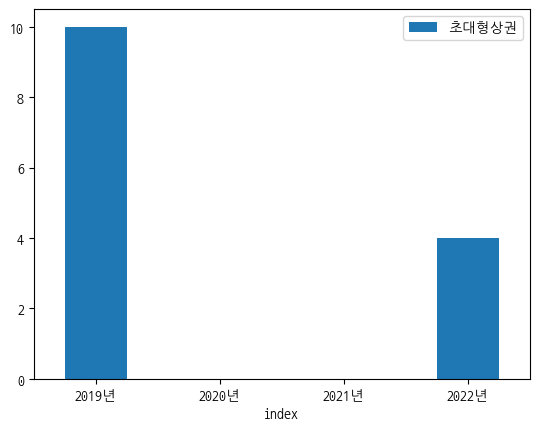

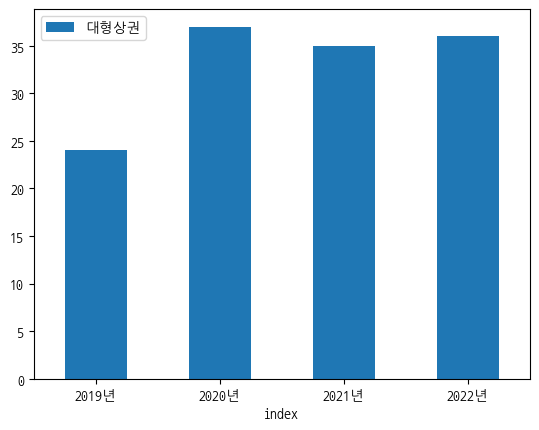

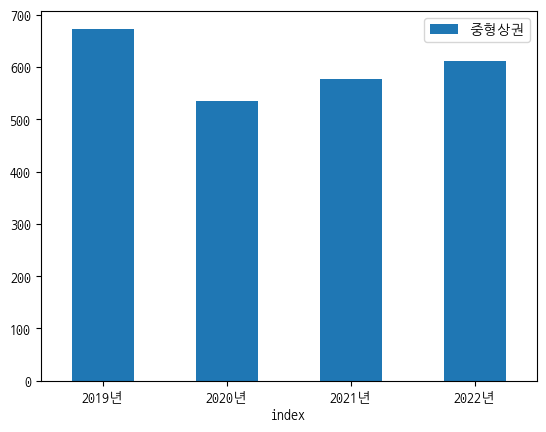

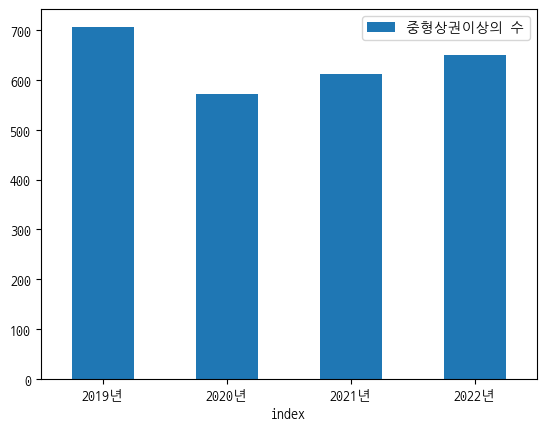

In [1104]:
market_count.plot.bar(x='index',y='초대형상권',rot=0)
market_count.plot.bar(x='index',y='대형상권',rot=0)
market_count.plot.bar(x='index',y='중형상권',rot=0)
market_count.plot.bar(x='index',y='중형상권이상의 수',rot=0)

# 몇가지 확인해보고 싶은 것
## 2019년의 초대형 상권들이 전부 대형상권이 되버린 것일까?
## 2022년의 초대형 상권 중에서 2019년에 초대형 상권이였던 곳이 있나?

</br>
</br>
</br>


## 2019년의 초대형 상권들이 전부 대형상권이 되버린 것일까?

In [1105]:
most_big_market_region_2019.head()

,index,상권_코드_명,점포_수,분기당_매출_금액,분기당_매출_건수,long,lat,유동인구,환승가능한버스노선,500m 버스정류장,환승가능지하철,500m 지하철역,상권규모
0,1,명동 남대문 북창동 다동 무교동 관광특구,8631,392306973005,16655824,126.981856,37.564149,138946.870968,9.555556,18,1.5,1,특대형상권
1,2,동대문패션타운 관광특구,13270,204760984791,6077340,127.011025,37.567312,107866.096774,5.473684,19,2.5,1,특대형상권
2,4,강남 마이스 관광특구,851,173926103805,4768635,127.060059,37.511003,101897.145161,5.818182,22,1.0,1,특대형상권
3,402,종각역,1834,133283055803,5696212,126.983496,37.570339,128279.516129,7.913043,23,1.0,1,특대형상권
4,423,명동(명동거리),2218,164980548089,8307033,126.984256,37.563230,124712.451613,8.500000,16,1.0,1,특대형상권


In [1106]:
big_market_region_2020.head()

,index,상권_코드_명,점포_수,분기당_매출_금액,분기당_매출_건수,long,lat,유동인구,환승가능한버스노선,500m 버스정류장,환승가능지하철,500m 지하철역,상권규모
0,0,명동 남대문 북창동 다동 무교동 관광특구,8830,376621394364,14118041,126.981856,37.564149,86138.322581,11.157895,19,1.5,1,대형상권
1,1,동대문패션타운 관광특구,13382,246639327198,8631823,127.011025,37.567312,66338.096774,6.000000,19,2.5,1,대형상권
2,2,종로?청계 관광특구,5285,259239790301,7588063,126.997374,37.569998,49171.016129,5.560000,25,1.5,1,대형상권
3,3,강남 마이스 관광특구,889,167195866008,3957523,127.060059,37.511003,68574.983871,5.818182,22,1.0,1,대형상권
4,283,종각역,2210,122895242318,5386880,126.983496,37.570339,81576.612903,7.680000,25,1.0,1,대형상권


# 간단하게 확인해보자 folium 좌표로 찍어보고 2019년의 특대형 상권이 보인다면 성공이다.

In [1107]:
my_map_test = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")


for each in range(len(most_big_market_region_2019)):
    marker_circle = folium.Circle([most_big_market_region_2019['lat'][each], most_big_market_region_2019['long'][each]],
                                       radius = 500,
                                        color = 'red',
                                        popup = most_big_market_region_2019['상권_코드_명'][each],
                                        fill_color = 'red'
                                       )
    marker_circle.add_to(my_map_test)
    
for each in range(len(big_market_region_2020)):
    marker_circle = folium.Circle([big_market_region_2020['lat'][each], big_market_region_2020['long'][each]],
                                       radius = 500,
                                        color = 'orange',
                                        popup = big_market_region_2020['상권_코드_명'][each],
                                        fill_color = 'orange'
                                       )
    marker_circle.add_to(my_map_test)


my_map_test

### 고속터미널의 경우 2019년에 초대형상권에서 2020년에 중형상권으로 추락했다.


## 2022년의 초대형 상권 중에서 2019년에 초대형 상권이였던 곳이 있나?

In [1108]:
my_map_test = folium.Map(location=[37.5502, 126.982], zoom_start=12, title="Stamen Toner")

for each in range(len(most_big_market_region_2019)):
    marker_circle = folium.Circle([most_big_market_region_2019['lat'][each], most_big_market_region_2019['long'][each]],
                                       radius = 500,
                                        color = 'orange',
                                        popup = most_big_market_region_2019['상권_코드_명'][each],
                                        fill_color = 'orange'
                                       )
    marker_circle.add_to(my_map_test)
    
    
for each in range(len(most_big_market_region_2022)):
    marker_circle = folium.Circle([most_big_market_region_2022['lat'][each], most_big_market_region_2022['long'][each]],
                                       radius = 500,
                                        color = 'red',
                                        popup = most_big_market_region_2022['상권_코드_명'][each],
                                        fill_color = 'red'
                                       )
    marker_circle.add_to(my_map_test)

my_map_test

### 2022년 특대형 상권은 2019년의 특대형 상권과 일치했으며 새롭게 생긴 곳은 없다

# 그러면 2019년~2022년 10월의 중형상권 이상의 유동인구는 어떻게 변화하였는가?
- 무식하게 모든 연도별 모든 유동인구를 더해보자.

In [1109]:
market_count = pd.DataFrame({'유동인구' : [market_2019["유동인구"].sum(), market_2020["유동인구"].sum(), market_2021["유동인구"].sum(),
                                           market_2022["유동인구"].sum()],
                             '중형상권의 수' : [len(market_2019["유동인구"]), len(market_2020["유동인구"]), len(market_2021["유동인구"]),
                                           len(market_2022["유동인구"])],
                             
                            }, index = ["2019년", "2020년", "2021년", "2022년"])
market_count = market_count.reset_index() 
market_count['중형상권 1곳당 유동 인구'] = market_count["유동인구"] / market_count["중형상권의 수"] 

<AxesSubplot: xlabel='index'>

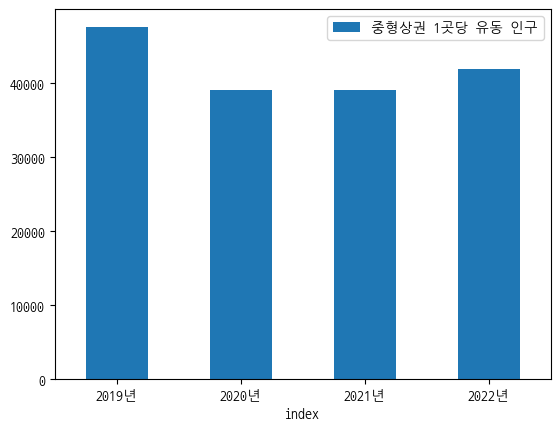

In [1110]:
market_count.plot.bar(x='index',y='중형상권 1곳당 유동 인구',rot=0)

### 중형상권이상 1곳당 유동인구는 2020년 낮아졌다가 조금씩 상승하고 있다.

# 이제 상권별 평균속도 데이터를 가져오자

In [1111]:
road_2022 = pd.read_csv('./2022_10_자동차_평균속도_위치데이터.csv', encoding='EUC-KR')
road_2021 = pd.read_csv('./2021_10_자동차_평균속도_위치데이터.csv', encoding='EUC-KR')
road_2020 = pd.read_csv('./2020_10_자동차_평균속도_위치데이터.csv', encoding='EUC-KR')
road_2019 = pd.read_csv('./2019_10_자동차_평균속도_위치데이터.csv', encoding='EUC-KR')
road_list = [road_2019, road_2020, road_2021, road_2022]

# 주간(시)의 평균 속도를 구하고, 평일을 기준으로 하자
- 출근시간(출근시간 (06~09) 점심시간(11~13)오후시간(14~16) 퇴근시간 (17~20)을 더하고 평균을 내자

In [1112]:
for i in range(len(road_list)):
    road_list[i] = road_list[i].fillna(0)
    road_list[i]["주간평균속도"] = (road_list[i]['출근시간 (06~09)'] + road_list[i]['퇴근시간 (17~20)'] + \
                            road_list[i]['점심시간(11~13)'] + road_list[i]['오후시간(14~16)']) / 4
    road_list[i] = road_list[i][['시점명', '종점명', '방향', '주중,주말', '주간평균속도', '시점 경도', '시점 위도', '종점 경도',  '종점 위도']]
    road_list[i] = road_list[i][road_list[i]['주중,주말'].isin(["주중"])]
    road_list[i] = road_list[i].reset_index()

- market_anual_list = []
- most_big_anual_list = []
- big_anual_list = []
- middle_anual_list = []

In [1113]:
import numpy as np
from haversine import haversine
from tqdm import tqdm

In [1114]:
most_big_anual_list = []
big_anual_list = []
middle_anual_list = []

for i in range(len(market_anual_list)):
    most_big_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] >= 100000)]
    most_big_market_region = most_big_market_region.loc[(most_big_market_region['분기당_매출_금액']/91) >= 1000000000]
    most_big_market_region["상권규모"] = "특대형상권"
    most_big_market_region = most_big_market_region.reset_index()
    most_big_anual_list.append(most_big_market_region)
    
for i in range(len(market_anual_list)):
    big_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] < 100000)]
    big_market_region =  big_market_region.loc[(big_market_region['분기당_매출_금액']/91) > 1000000000]
    big_market_region["상권규모"] = "대형상권"
    big_market_region = big_market_region.reset_index()
    big_anual_list.append(big_market_region)    

for i in range(len(market_anual_list)):
    middle_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] < 100000)]
    middle_market_region = middle_market_region.loc[(middle_market_region['분기당_매출_금액']/91) < 1000000000]
    middle_market_region["상권규모"] = "중형상권"
    middle_market_region = middle_market_region.sort_values(by='유동인구', ascending=False)
    middle_market_region = middle_market_region.head(100-len(most_big_anual_list[i])-len(big_anual_list[i])) 
    middle_market_region = middle_market_region.reset_index()
    middle_anual_list.append(middle_market_region)

In [1115]:
for i in range(len(market_anual_list)):
    most_big_anual_list[i]["상권의 도로 평균 속도"] = 0.
    big_anual_list[i]["상권의 도로 평균 속도"] = 0.
    middle_anual_list[i]["상권의 도로 평균 속도"] = 0.

In [1116]:
def make_poly_line(road_df, each, my_map):
    if road_df['방향'][each] == "상행":
        location_data = [[road_df['시점 위도'][each], road_df['시점 경도'][each]],
                         [road_df['종점 위도'][each], road_df['종점 경도'][each]]]
        b = haversine([road_df['시점 위도'][each], road_df['시점 경도'][each]],
                      [road_df['종점 위도'][each], road_df['종점 경도'][each]], unit = 'm')
            
    if road_2022['방향'][each] == "하행":
        location_data = [[float(road_df['시점 위도'][each])+0.0001, float(road_df['시점 경도'][each]+0.0006)],
                        [float(road_df['종점 위도'][each])+0.0001, float(road_df['종점 경도'][each])+0.0006]]
                
        b = haversine([float(road_df['시점 위도'][each])+0.0001, float(road_df['시점 경도'][each])+0.0006], 
                    [float(road_df['종점 위도'][each])+0.0001, float(road_df['종점 경도'][each])+0.0006], unit = 'm')

        if b < 5500:
                if road_df['주간평균속도'][each] >= 25:
                    folium.PolyLine(locations=location_data, tooltip='Polyline', color='green').add_to(my_map)

                elif road_df['주간평균속도'][each] > 15:
                    folium.PolyLine(locations=location_data, tooltip='Polyline', color="yellow").add_to(my_map)

                else:
                    folium.PolyLine(locations=location_data, tooltip='Polyline', color='red').add_to(my_map)


In [1117]:
def make_road(market_degree, road_data, my_map):
    for i in range(len(market_degree)):
        road_count = 0
        market_region_location =  (market_degree['lat'][i], market_degree['long'][i])

        for each in range(len(road_data)):

            road_location = (road_data['시점 위도'][each], road_data['시점 경도'][each])
            a = haversine(road_location, market_region_location, unit = 'm')
            if a < 500:
                road_count = road_count + 1
                print(market_degree['상권의 도로 평균 속도'][i])
                    
                market_degree['상권의 도로 평균 속도'][i] = market_degree['상권의 도로 평균 속도'][i] +\
                                                                                road_data['주간평균속도'][each]
                print(market_degree['상권의 도로 평균 속도'][i])

                make_poly_line(road_data, each, my_map)


            road_location = (road_data['종점 위도'][each], road_data['종점 경도'][each])
            a = haversine(road_location, market_region_location, unit = 'm') 
            if a < 500:
                road_count = road_count + 1
                market_degree['상권의 도로 평균 속도'][i] = market_degree['상권의 도로 평균 속도'][i] +\
                                                                                road_data['주간평균속도'][each] 
                
                print(market_degree['상권의 도로 평균 속도'][i])
                
                make_poly_line(road_data, each, my_map)


        print(str(market_degree["상권의 도로 평균 속도"][i]) + "여기다가 " + str(road_count) + "나누면")
        market_degree["상권의 도로 평균 속도"][i] = market_degree['상권의 도로 평균 속도'][i] / road_count
        print(str(market_degree["상권의 도로 평균 속도"][i]))

In [1118]:
my_map_road_2019 = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")
my_map_road_2020 = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")
my_map_road_2021 = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")
my_map_road_2022 = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")
map_road_list = [my_map_road_2019, my_map_road_2020, my_map_road_2021, my_map_road_2022]

In [1119]:
for i in range(4):
    gu_line(map_road_list[i])
    make_road(most_big_anual_list[i], road_list[i], map_road_list[i])
    make_road(big_anual_list[i], road_list[i], map_road_list[i])
    make_road(middle_anual_list[i], road_list[i], map_road_list[i])
    make_market_region(most_big_anual_list[i], big_anual_list[i], middle_anual_list[i], map_road_list[i])

/home/du/venv/opencv/lib/python3.8/site-packages/folium/folium.py:407: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(
/tmp/ipykernel_4432/1834461262.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  market_degree['상권의 도로 평균 속도'][i] = market_degree['상권의 도로 평균 속도'][i] +\
/tmp/ipykernel_4432/1834461262.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  market_degree['상권의 도로 평균 속도'][i] = market_degree['상권의 도로 평균 속도'][i] +\
/tmp/ipykernel_4432/1834461262.

22.105000000000004
22.105000000000004
45.470000000000006
62.84250000000001
62.84250000000001
75.58500000000001
88.32750000000001
88.32750000000001
100.60250000000002
112.87750000000003
130.70750000000004
130.70750000000004
157.85000000000005
157.85000000000005
180.28750000000005
202.72500000000005
202.72500000000005
228.54500000000004
254.36500000000004
254.36500000000004
274.595
274.595
290.19000000000005
305.7850000000001
305.7850000000001
333.05250000000007
360.32000000000005
360.32000000000005
375.19500000000005
386.37000000000006
401.9025000000001
441.23500000000007
484.50750000000005
484.50750000000005
516.3975
516.3975
555.1025000000001
555.1025000000001
584.85
584.85
617.135
632.845
632.845
641.955
674.5150000000001
674.5150000000001
685.7700000000001
697.0250000000001
697.0250000000001
726.9175000000001
756.8100000000002
756.8100000000002
776.8275000000002
796.8450000000003
796.8450000000003
821.2400000000002
833.0450000000002
833.0450000000002
874.8100000000002
874.8100000000

138.2525
138.2525
162.125
162.125
177.4875
192.85000000000002
192.85000000000002
205.5525
218.255
218.255
244.8675
271.48
271.48
280.03000000000003
288.58000000000004
288.58000000000004
304.19000000000005
325.9825000000001
325.9825000000001
343.12000000000006
360.25750000000005
360.25750000000005
374.93250000000006
374.93250000000006
387.1700000000001
399.4075000000001
420.0850000000001
420.0850000000001
432.0675000000001
444.5950000000001
465.7200000000001
465.7200000000001
484.0975000000001
499.67250000000007
499.67250000000007
513.2825
526.8925
526.8925
547.5
547.5
567.375
587.25
587.25
609.38
631.51
631.51
658.7825
686.0550000000001
686.0550000000001
706.0725000000001
726.0900000000001
726.0900000000001
738.1200000000001
759.6775000000001
759.6775000000001
778.4975000000002
797.3175000000002
797.3175000000002
819.4975000000002
839.0400000000002
839.0400000000002
859.4450000000002
879.8500000000001
879.8500000000001
899.0625000000001
918.2750000000001
918.2750000000001
935.000000000

433.86499999999995
433.86499999999995
489.84749999999997
489.84749999999997
553.5999999999999
613.6949999999999
613.6949999999999
636.8124999999999
661.8249999999999
661.8249999999999여기다가 18나누면
36.76805555555555
0.0
14.8475
29.695
29.695
51.8775
74.06
74.06
95.27000000000001
116.10500000000002
139.06750000000002
163.80500000000004
163.80500000000004
181.96750000000003
181.96750000000003
201.66750000000002
201.66750000000002여기다가 10나누면
20.16675
17.7775
17.7775
29.244999999999997
29.244999999999997
67.99
85.55499999999999
85.55499999999999
102.17249999999999
113.88499999999999
134.79749999999999
134.79749999999999
156.765
156.765여기다가 8나누면
19.595625
13.887500000000001
13.887500000000001
33.5075
33.5075
51.0775
71.73
71.73
86.6025
104.11500000000001
104.11500000000001
129.4225
147.1525
147.1525여기다가 8나누면
18.3940625
26.3425
57.722500000000004
57.722500000000004
74.875
74.875
124.53999999999999
143.215
143.215
158.5525
158.5525
181.4975
197.0275
197.0275여기다가 8나누면
24.6284375
23.865000000000002


301.15
314.76
314.76
335.3675
335.3675
355.2425
367.27250000000004
367.27250000000004
386.81500000000005
386.81500000000005
407.22
426.4325
442.4975
442.4975
462.55
479.02
498.28499999999997
498.28499999999997
512.92
512.92
529.115
540.05
540.05
557.5899999999999
557.5899999999999
565.805
574.02
589.76
589.76
603.08
616.4000000000001
616.4000000000001
629.9225000000001
629.9225000000001
637.3875000000002
644.8525000000002
644.8525000000002
668.3850000000002
691.9175000000002
691.9175000000002
702.0950000000003
712.2725000000003
712.2725000000003
731.7025000000002
750.0700000000002
777.1000000000001
807.6400000000001
807.6400000000001
830.7100000000002
830.7100000000002
841.8375000000002
841.8375000000002여기다가 54나누면
15.589583333333337
17.5775
42.6275
64.88
64.88
97.7575
97.7575
112.22999999999999
126.70249999999999
126.70249999999999
162.3875
198.0725
198.0725
217.14
217.14
236.17999999999998
236.17999999999998
257.9325
274.8225
314.6725
314.6725
335.5425
361.93
377.4325
377.4325
414.032

250.68000000000006
250.68000000000006
264.24750000000006
264.24750000000006
279.82250000000005
295.39750000000004
295.39750000000004
309.00750000000005
322.61750000000006
322.61750000000006
343.2250000000001
363.8325000000001
363.8325000000001
383.7075000000001
403.5825000000001
420.0525000000001
441.0825000000001
441.0825000000001
458.5775000000001
458.5775000000001
477.8425000000001
497.1075000000001
497.1075000000001
511.74250000000006
511.74250000000006
527.9375000000001
544.1325000000002
566.8800000000001
581.9475000000001
581.9475000000001
594.9800000000001
594.9800000000001
610.7200000000001
624.2425000000002
643.6725000000001
643.6725000000001
659.6100000000001
659.6100000000001
677.9775000000001
677.9775000000001여기다가 40나누면
16.949437500000002
17.5225
17.5225
48.22
70.82249999999999
70.82249999999999
95.91999999999999
121.01749999999998
121.01749999999998
141.8825
141.8825
157.7325
173.58249999999998
173.58249999999998
207.36749999999998
241.15249999999997
261.0875
261.0875
281.

328.7075
343.1375
357.5675
357.5675
384.8975
384.8975
401.585
418.2725
418.2725
441.5075
454.905
469.59
469.59여기다가 26나누면
18.061153846153847
0.0
17.830000000000002
38.06
38.06
44.25
50.44
50.44
68.95
68.95
109.04
109.04
123.6575
138.275
164.4275
164.4275
191.5
218.5725
218.5725
235.18
235.18
251.65
268.12
277.17
299.54
299.54
321.38
321.38
333.1175
344.855
344.855
353.8825
362.90999999999997
362.90999999999997
382.72249999999997
402.53499999999997
402.53499999999997
421.4475
421.4475
439.455
439.455
451.84999999999997
464.24499999999995
464.24499999999995
479.0174999999999
493.7899999999999
493.7899999999999
506.2224999999999
524.1674999999999
542.3774999999999
542.3774999999999
568.525
568.525
579.1925
597.0225
614.7900000000001
614.7900000000001
619.7750000000001
619.7750000000001
631.1100000000001
642.4450000000002
642.4450000000002
661.2775000000001
680.1100000000001
680.1100000000001
704.2150000000001
720.2800000000002
720.2800000000002
736.7175000000002
736.7175000000002
753.37500

735.3950000000001여기다가 30나누면
24.51316666666667
24.562500000000004
24.562500000000004
44.115
63.667500000000004
63.667500000000004
91.7625
91.7625
117.785
117.785
139.2275
160.67
188.0975
188.0975
211.215
236.22750000000002
236.22750000000002여기다가 10나누면
23.622750000000003
14.4725
14.4725
50.1575
50.1575
69.225
86.115
86.115
111.08999999999999
111.08999999999999
137.4775
163.86499999999998
203.28999999999996
218.79249999999996
218.79249999999996
255.39249999999996
291.99249999999995
291.99249999999995
314.38249999999994
343.19249999999994
385.86249999999995
385.86249999999995
419.84999999999997
419.84999999999997
449.86749999999995
479.88499999999993
479.88499999999993
523.4749999999999
567.0649999999999
567.0649999999999
618.0574999999999
618.0574999999999
638.6274999999999
664.54
664.54여기다가 22나누면
30.206363636363633
0.0
26.185
26.185
47.6575
67.72999999999999
83.98499999999999
83.98499999999999
99.69999999999999
99.69999999999999
124.32999999999998
143.58749999999998
160.2925
160.2925여기다가

224.23250000000002
258.4825
271.875
271.875
295.2525
308.905
308.905여기다가 16나누면
19.3065625
0.0
30.025
30.025
41.5575
66.22
82.55
92.36749999999999
92.36749999999999
107.23499999999999
107.23499999999999
119.63999999999999
132.045
132.045
148.90499999999997
165.765
165.765
180.0725
194.9775
194.9775
210.9825
226.98749999999998
226.98749999999998
243.89999999999998
259.7125
280.8375
280.8375
299.215
299.215
310.93499999999995
324.0799999999999
354.6424999999999
354.6424999999999
375.0199999999999
395.3974999999999
395.3974999999999
425.37499999999994
455.35249999999996
455.35249999999996
467.05499999999995
467.05499999999995
492.74999999999994
518.4449999999999
518.4449999999999
540.685
562.925
562.925
584.4825
606.6624999999999
627.5224999999999
627.5224999999999
641.8549999999999
641.8549999999999
663.2399999999999
684.6249999999999
684.6249999999999
709.4899999999999
734.3549999999999
734.3549999999999
755.3849999999999
772.8799999999999
791.5524999999999
791.5524999999999
808.80499999

0.0
13.625000000000002
27.250000000000004
27.250000000000004
48.752500000000005
48.752500000000005
62.03
75.3075
95.92750000000001
95.92750000000001
113.06
130.1925
130.1925
147.975
147.975
162.87
183.1775
201.055
223.95000000000002
223.95000000000002
241.31500000000003
241.31500000000003
262.16
288.4075
288.4075여기다가 16나누면
18.02546875
20.9525
20.9525
42.3925
65.66
65.66
83.4
101.14000000000001
101.14000000000001
116.02750000000002
130.91500000000002
151.41750000000002
151.41750000000002
182.88500000000002
182.88500000000002
216.08
249.275
249.275
284.105
318.935
318.935
339.5175
339.5175
355.53999999999996
371.56249999999994
371.56249999999994
399.17999999999995
426.79749999999996
426.79749999999996
441.2125
455.6275
471.8575
471.8575
485.245
498.6325
498.6325
515.28
515.28
535.5124999999999
554.8174999999999
582.6624999999999
582.6624999999999
596.4099999999999
610.1574999999998
610.1574999999998
644.1324999999998
678.1074999999998
678.1074999999998
702.1524999999998
726.1974999999998

433.4725
488.9225
488.9225
551.095
611.7025
611.7025
635.8199999999999
660.9399999999999
660.9399999999999여기다가 18나누면
36.718888888888884
0.0
25.122500000000002
50.245000000000005
50.245000000000005
65.125
80.005
95.71249999999999
95.71249999999999
116.2175
136.7225
136.7225
156.45499999999998
176.1875
176.1875
198.525
198.525
231.23250000000002
263.94
263.94
278.67
293.40000000000003
293.40000000000003
324.76750000000004
356.13500000000005
356.13500000000005
374.24000000000007
396.31250000000006
396.31250000000006
431.51000000000005
466.70750000000004
466.70750000000004
492.53000000000003
518.3525000000001
551.34
551.34
578.22
578.22
596.9100000000001
615.6000000000001
633.8550000000001
665.7725000000002
665.7725000000002
681.8600000000001
707.7150000000001
707.7150000000001
729.2825000000001
729.2825000000001
757.6650000000002
777.6850000000002
777.6850000000002
797.2875000000001
797.2875000000001
819.3000000000002
838.3175000000002
838.3175000000002
853.1825000000002
868.0475000000002

0.0
26.495
26.495
47.175
67.85499999999999
84.40249999999999
84.40249999999999
98.72749999999999
113.0525
113.0525
129.39249999999998
153.90249999999997
153.90249999999997
175.53249999999997
189.32249999999996
202.85999999999996
216.21749999999994
216.21749999999994
234.22749999999994
234.22749999999994
249.07499999999993
249.07499999999993
266.37749999999994
283.67999999999995
283.67999999999995
308.84
308.84
325.9325
343.025
343.025
368.04749999999996
380.24499999999995
395.43499999999995
395.43499999999995여기다가 22나누면
17.97431818181818
0.0
29.01
29.01
40.760000000000005
68.0575
83.75
83.75
97.375
111.0
111.0
132.5025
132.5025
145.78
159.0575
179.6775
179.6775
196.81
213.9425
234.8825
234.8825
251.98749999999998
283.825
283.825
306.2975
306.2975
329.18
353.0825
375.97749999999996
375.97749999999996
393.3425
393.3425
414.1875
435.0325
435.0325
461.28000000000003
487.52750000000003
487.52750000000003
511.06000000000006
530.0325
552.0175
552.0175
576.61
576.61
594.88
613.15
613.15
637.84


456.0825
456.0825
473.895
473.895
490.59749999999997
503.8825
503.8825여기다가 22나누면
22.90375
30.865000000000002
30.865000000000002
57.86
57.86
72.39
100.93
131.0625
147.535
147.535
172.735
172.735
194.085
214.6575
214.6575
235.345
235.345
248.64
266.6275
266.6275여기다가 12나누면
22.218958333333333
30.605
30.605
62.599999999999994
62.599999999999994
91.345
120.205
120.205
149.1925
149.1925
181.0325
224.64249999999998
241.89999999999998
241.89999999999998
271.55249999999995
301.2049999999999
326.3924999999999
326.3924999999999
347.5874999999999
368.7824999999999
368.7824999999999
388.6099999999999
388.6099999999999
406.3624999999999
424.1149999999999
444.3974999999999
444.3974999999999
463.49999999999994
482.60249999999996
482.60249999999996
496.24999999999994
496.24999999999994
516.7275
535.6175
535.6175
562.625
589.6325
589.6325
609.1725
609.1725
630.4475
651.7225
675.65
691.9775
691.9775
709.79
709.79
726.4925
739.7774999999999
739.7774999999999여기다가 32나누면
23.118046874999997
0.0
23.2675
46.535


51.575
51.575
79.315
79.315
102.1
122.98749999999998
152.18249999999998
175.52249999999998
175.52249999999998
190.96249999999998
190.96249999999998
219.93249999999998
219.93249999999998
250.0125
280.0925
280.0925
303.65
303.65
317.28499999999997
330.91999999999996
330.91999999999996
351.34999999999997
371.90999999999997
385.80499999999995
385.80499999999995
414.7074999999999
414.7074999999999
430.7724999999999
450.1474999999999
468.94749999999993
468.94749999999993여기다가 22나누면
21.31579545454545
20.9525
20.9525
42.3925
42.3925
65.66
97.1275
97.1275
111.5425
125.95750000000001
142.1875
142.1875
155.575
168.96249999999998
168.96249999999998
185.60999999999999
185.60999999999999
205.84249999999997
225.14749999999998
240.0425
240.0425
253.79
267.53749999999997
267.53749999999997
301.5125
301.5125
325.5575
349.6025
349.6025
379.545
409.4875
409.4875
427.365
427.365
454.91
482.45500000000004
482.45500000000004
498.14250000000004
513.83
513.83
528.99
544.15
569.8275
569.8275
584.005
598.1825
598

297.40000000000003
311.57750000000004
325.75500000000005
325.75500000000005
339.63500000000005
353.51500000000004
387.40250000000003
387.40250000000003
414.69500000000005
441.98750000000007
441.98750000000007
473.82500000000005
505.6625
505.6625
521.565
521.565
546.8100000000001
572.0550000000001
572.0550000000001
594.5275
617.0
617.0
639.8825
663.7850000000001
663.7850000000001
688.3775
712.97
712.97
733.405
753.8399999999999
778.53
778.53
797.7075
816.885
816.885
833.3
833.3
851.9499999999999
870.5999999999999
893.7375
893.7375
924.12
924.12
940.585
957.0500000000001
977.4325000000001
977.4325000000001
995.6250000000001
1013.8175000000001
1013.8175000000001
1035.3825000000002
1056.9475000000002
1056.9475000000002
1079.4025000000001
1079.4025000000001
1100.8375
1122.2725
1122.2725여기다가 54나누면
20.782824074074075
0.0
22.905
22.905
45.535000000000004
64.74000000000001
83.86500000000001
83.86500000000001
112.20250000000001
112.20250000000001
131.20250000000001
152.09000000000003
171.0425000

313.09749999999997
313.09749999999997
328.42999999999995
353.32499999999993
367.23749999999995
367.23749999999995
405.11749999999995
405.11749999999995
424.775
471.5025
471.5025
521.67
521.67여기다가 20나누면
26.083499999999997
22.1375
22.1375
41.3725
61.072500000000005
61.072500000000005
93.08000000000001
93.08000000000001
120.58000000000001
139.15750000000003
139.15750000000003
163.96500000000003
188.77250000000004
188.77250000000004
211.38750000000005
234.00250000000005
234.00250000000005
254.44500000000005
274.88750000000005
274.88750000000005
300.07500000000005
325.37000000000006
325.37000000000006
341.4150000000001
357.4600000000001
357.4600000000001
379.8350000000001
399.6625000000001
399.6625000000001여기다가 18나누면
22.203472222222228
18.7275
34.552499999999995
34.552499999999995
50.96249999999999
67.37249999999999
67.37249999999999
88.15749999999998
108.94249999999998
126.54749999999999
126.54749999999999
164.32999999999998
164.32999999999998
189.17499999999998
214.01999999999998
214.0199

102.39999999999999
115.94
115.94
132.31
148.0525
148.0525
167.8675
167.8675
181.0925
194.1575
194.1575
208.64249999999998
224.61749999999998
241.26
241.26
260.83
260.83
285.0825
300.185
300.185
319.77
339.6425
339.6425
361.7075
361.7075
383.1475
383.1475
400.80499999999995
418.4625
434.36249999999995
453.65
453.65
469.25
484.85
484.85
501.425
501.425
522.5175
522.5175
538.1800000000001
553.8425000000001
568.5400000000001
568.5400000000001
587.335
606.13
606.13
615.8375
625.545
641.3774999999999
641.3774999999999
656.67
671.9625
671.9625
688.2175
688.2175
696.9225
705.6275
705.6275
726.7025000000001
747.7775000000001
747.7775000000001
758.1000000000001
768.4225000000001
768.4225000000001
787.3375000000001
806.0675000000001
835.0050000000001
868.3700000000001
868.3700000000001
889.9725000000001
889.9725000000001
904.21
904.21여기다가 54나누면
16.74462962962963
19.7
19.7
51.707499999999996
51.707499999999996
79.2075
97.785
127.4375
152.245
152.245
172.6875
172.6875
197.875
223.0625
223.0625
244.

216.595
216.595
232.3875
232.3875
253.30499999999998
277.59999999999997
277.59999999999997여기다가 16나누면
17.349999999999998
21.247500000000002
21.247500000000002
40.785000000000004
60.462500000000006
60.462500000000006
76.4375
92.4125
92.4125
106.4675
120.52250000000001
139.395
139.395
171.0675
171.0675
202.79749999999999
234.52749999999997
234.52749999999997
267.15749999999997
299.78749999999997
299.78749999999997
319.80249999999995
319.80249999999995
335.18749999999994
350.57249999999993
350.57249999999993
378.12499999999994
405.67749999999995
405.67749999999995
420.06499999999994
434.45249999999993
449.7724999999999
449.7724999999999
462.56499999999994
475.35749999999996
475.35749999999996
491.74749999999995
491.74749999999995
510.7774999999999
529.8725
559.9399999999999
559.9399999999999
573.3749999999999
586.8099999999998
586.8099999999998
621.4299999999998
656.0499999999998
656.0499999999998
679.7524999999998
703.4549999999998
703.4549999999998
731.7824999999998
745.8249999999998
745

377.14750000000004
392.6575
392.6575
413.14500000000004
432.68500000000006
454.43000000000006
506.00250000000005
506.00250000000005
560.7850000000001
560.7850000000001
622.0000000000001
679.1000000000001
679.1000000000001
702.6950000000002
726.0625000000001
726.0625000000001여기다가 22나누면
33.002840909090914
0.0
24.057499999999997
48.114999999999995
48.114999999999995
63.51499999999999
78.91499999999999
94.1625
94.1625
116.3775
138.5925
138.5925
157.3
176.00750000000002
176.00750000000002
198.10500000000002
198.10500000000002
229.85250000000002
261.6
261.6
275.1225
288.645
288.645
319.3375
350.03
350.03
364.72749999999996
385.46999999999997
385.46999999999997
419.2
452.93
452.93
477.925
502.92
535.1725
535.1725
561.66
561.66
579.3974999999999
597.1349999999999
614.7224999999999
647.3549999999999
647.3549999999999
662.3224999999999
687.7074999999999
687.7074999999999
708.7874999999999
708.7874999999999
736.55
756.4
756.4
775.81
775.81
796.88
815.6975
815.6975
829.465
843.2325000000001
858.98

429.7325
429.7325
460.865
460.865
493.045
525.225
525.225
551.7850000000001
578.345
578.345
593.905
609.4649999999999
609.4649999999999
640.8874999999999
663.2024999999999
663.2024999999999
683.9774999999998
704.7524999999998
704.7524999999998
731.1849999999998
761.1399999999999
761.1399999999999
781.5474999999999
801.9549999999999
816.1049999999999
834.4474999999999
834.4474999999999
864.3274999999999
894.2074999999999
894.2074999999999
908.8899999999999
923.5724999999999
923.5724999999999
943.6299999999999
963.6874999999999
963.6874999999999
986.6324999999999
1009.5775
1009.5775
1024.99
1040.4025
1040.4025
1064.5525
1088.7025
1088.7025
1106.66
1124.6175
1124.6175
1160.3200000000002
1160.3200000000002
1175.9950000000001
1191.67
1191.67
1215.3400000000001
1215.3400000000001
1248.055
1279.815
1314.0775
1314.0775
1333.8950000000002
1353.7125000000003
1353.7125000000003
1375.3400000000004
1396.9675000000004
1396.9675000000004
1417.8625000000004
1438.7575000000004
1438.7575000000004
1459.7

47.34
47.34
74.0675
74.0675
98.86749999999999
117.7525
145.95
170.79
170.79
185.9175
185.9175
213.73499999999999
213.73499999999999
242.90749999999997
272.08
272.08
295.0875
295.0875
309.26
323.4325
323.4325
343.05
364.4175
377.4425
377.4425
405.025
405.025
421.2525
438.88
454.1525
478.90999999999997
478.90999999999997
499.18749999999994
499.18749999999994
531.9024999999999
552.5849999999999
552.5849999999999여기다가 26나누면
21.253269230769227
0.0
15.71
29.130000000000003
47.34
47.34
74.0675
74.0675
98.86749999999999
117.7525
136.17
136.17
174.225
174.225
202.42249999999999
230.61999999999998
255.45999999999998
255.45999999999998
270.5875
285.715
285.715
313.53249999999997
313.53249999999997
340.53249999999997
352.6975
352.6975
381.87
411.0425
411.0425
434.05
434.05
448.2225
462.39500000000004
462.39500000000004
482.01250000000005
503.38000000000005
516.4050000000001
516.4050000000001
543.9875000000001
543.9875000000001
560.215
577.8425000000001
593.1150000000001
617.8725000000002
629.945000

360.2124999999999
375.25999999999993
375.25999999999993
394.7274999999999
394.7274999999999
418.6924999999999
418.6924999999999
443.08999999999986
467.48749999999984
467.48749999999984
495.31249999999983
495.31249999999983
514.3024999999998
533.2924999999998
533.2924999999998
548.0349999999997
562.7774999999997
583.6824999999997
583.6824999999997
603.1899999999997
622.6974999999998
622.6974999999998
643.5149999999998
664.3324999999998
664.3324999999998
684.8449999999998
705.3574999999998
727.1274999999998
727.1274999999998
755.6849999999998
755.6849999999998
775.0924999999999
794.4999999999999
794.4999999999999
816.0649999999999
837.63
855.2125
874.5275
874.5275
889.1025000000001
889.1025000000001
905.4575000000001
920.8950000000001
920.8950000000001
939.4000000000001
939.4000000000001
948.6600000000001
957.9200000000001
974.0075
974.0075
990.8825
1007.7575
1007.7575
1024.555
1024.555
1034.915
1045.2749999999999
1045.2749999999999
1067.3749999999998
1078.1299999999999
1105.212499999999

52.49750000000001
76.92000000000002
98.64250000000001
98.64250000000001
115.36000000000001
132.07750000000001
132.07750000000001
151.705
151.705
171.86
192.01500000000001
202.5875
202.5875
214.25
230.5075
230.5075
247.495
247.495
272.02
291.215
308.63
308.63
330.495
330.495
341.45
358.555
358.555
373.725
388.89500000000004
388.89500000000004
399.80500000000006
410.7150000000001
410.7150000000001
441.3550000000001
471.99500000000006
471.99500000000006
488.88500000000005
505.77500000000003
505.77500000000003
520.39
535.005
535.005
554.31
554.31
584.03
613.75
635.5675
635.5675여기다가 34나누면
18.69316176470588
19.7875
44.425
44.425
74.4075
74.4075
98.125
112.5125
112.5125
128.45250000000001
144.3925
144.3925
159.7125
175.0325
190.39
190.39
206.58999999999997
222.78999999999996
222.78999999999996
240.41749999999996
240.41749999999996
253.20999999999995
253.20999999999995
269.59999999999997
285.98999999999995
285.98999999999995
299.37499999999994
312.75999999999993
312.75999999999993
326.52749999

67.94999999999999
67.94999999999999
82.41999999999999
82.41999999999999
100.79999999999998
119.17999999999998
119.17999999999998
150.45999999999998
181.73999999999998
181.73999999999998
210.15249999999997
227.03499999999997
227.03499999999997
251.37749999999997
275.71999999999997
275.71999999999997
297.8375
319.955
319.955
338.515
357.075
357.075
382.6475
407.78499999999997
407.78499999999997
422.29999999999995
436.81499999999994
436.81499999999994
458.86999999999995
478.17249999999996
478.17249999999996여기다가 22나누면
21.735113636363636
15.525
15.525
44.6375
72.1975
72.1975
100.8425
100.8425
142.685
180.3975
180.3975
196.60250000000002
211.08
211.08여기다가 8나누면
26.385
0.0
25.729999999999997
25.729999999999997
46.162499999999994
66.595
86.78999999999999
86.78999999999999
101.475
116.16
116.16
131.215
152.6925
152.6925
173.5375
194.3825
194.3825
207.8875
221.39249999999998
221.39249999999998
241.9825
270.6275
283.8025
297.3825
297.3825
314.6825
314.6825
327.8625
327.8625
344.305
360.7475
360.74

468.61999999999995
468.61999999999995
499.75249999999994
499.75249999999994
531.9324999999999
564.1124999999998
564.1124999999998
590.6724999999999
617.2324999999998
617.2324999999998
632.7924999999998
648.3524999999997
648.3524999999997
679.7749999999997
700.8124999999998
700.8124999999998
721.6124999999997
721.6124999999997
743.9274999999998
766.2424999999998
766.2424999999998
787.0174999999998
807.7924999999998
807.7924999999998
834.2249999999998
860.6574999999998
890.6124999999998
890.6124999999998
911.0199999999999
931.4274999999999
945.5774999999999
945.5774999999999
975.4574999999999
1005.3374999999999
1005.3374999999999
1020.0199999999999
1034.7024999999999
1034.7024999999999
1054.7599999999998
1074.8174999999997
1074.8174999999997
1097.7624999999996
1120.7074999999995
1120.7074999999995
1136.1199999999994
1151.5324999999993
1151.5324999999993
1175.6824999999994
1199.8324999999995
1199.8324999999995
1217.7899999999995
1233.4649999999995
1254.9124999999995
1254.9124999999995
127

33.8925
33.8925
60.245
60.245
85.79249999999999
120.88999999999999
120.88999999999999
143.42999999999998
165.96999999999997
165.96999999999997
184.82249999999996
203.67499999999995
222.72999999999996
222.72999999999996
242.28249999999997
242.28249999999997
259.3875
276.4925
276.4925
297.87
319.2475
328.175
353.5975
353.5975
366.3675
366.3675
378.7125
391.0575
391.0575
413.795
413.795
423.27750000000003
432.76000000000005
456.64500000000004
456.64500000000004
476.45000000000005
476.45000000000005여기다가 24나누면
19.852083333333336
0.0
16.555
36.955
54.6725
54.6725
70.8675
87.0625
87.0625
99.65
99.65
110.295
120.94
120.94
141.275
161.61
161.61
174.22750000000002
186.84500000000003
186.84500000000003
201.90750000000003
216.97000000000003
232.49250000000004
232.49250000000004
252.49500000000003
272.49750000000006
272.49750000000006
285.93750000000006
285.93750000000006
300.2225000000001
314.5075000000001
314.5075000000001
330.60750000000013
346.70750000000015
362.13250000000016
376.9825000000002

270.4775여기다가 16나누면
16.90484375
0.0
25.37
25.37
46.61
67.1275
82.41
82.41
98.4875
98.4875
122.175
141.51
157.285
157.285여기다가 8나누면
19.660625
21.5175
21.5175
40.5125
40.5125
69.3575
98.2025
98.2025
115.25
115.25
137.245
159.24
159.24
179.6775
200.115
217.86
217.86
244.11
270.36
270.36
287.2825
300.3525
300.3525
325.93
351.5075
351.5075
372.03249999999997
372.03249999999997
390.30499999999995
408.57749999999993
408.57749999999993
431.5274999999999
454.4774999999999
476.1649999999999
476.1649999999999
506.1874999999999
536.2099999999999
536.2099999999999
562.56
562.56
576.9499999999999
591.3399999999999
591.3399999999999
614.56
637.78
656.865
656.865
682.225
682.225
696.6575
711.09
740.195
740.195
753.7175000000001
767.2400000000001
784.9775000000001
784.9775000000001
803.4000000000001
803.4000000000001
825.7075000000001
849.6875000000001
849.6875000000001
866.8150000000002
866.8150000000002
883.2825000000001
899.1125000000002
916.8625000000002
916.8625000000002여기다가 44나누면
20.837784090909096

20.0775
44.2425
44.2425
68.4375
68.4375
89.555
111.1275
111.1275
150.625
150.625
178.57999999999998
193.31249999999997
206.77749999999997
227.03249999999997
227.03249999999997
246.88249999999996
246.88249999999996여기다가 11나누면
22.443863636363634
13.2175
13.2175
33.2475
53.2775
53.2775
83.6525
83.6525
102.26750000000001
120.88250000000002
140.25500000000002
140.25500000000002
159.07500000000002
159.07500000000002
179.32500000000002
204.6725
204.6725
216.995
216.995
237.4425
257.89
271.8725
271.8725
295.0975
295.0975
316.64250000000004
338.18750000000006
338.18750000000006
373.4825000000001
408.7775000000001
408.7775000000001
422.7550000000001
436.73250000000013
436.73250000000013
458.33000000000015
479.9275000000002
479.9275000000002
508.81250000000017
508.81250000000017
531.1050000000001
553.3975000000002
577.9625000000002
577.9625000000002
592.5900000000003
614.8475000000003
632.4575000000003
651.8750000000003
651.8750000000003
670.0225000000004
670.0225000000004
697.9150000000004
697.91

1451.047499999999
1473.452499999999
1490.7399999999989
1490.7399999999989
1511.504999999999
1532.269999999999
1551.904999999999
1551.904999999999
1574.8674999999992
1597.8299999999992
1597.8299999999992
1617.6174999999992
1636.8599999999992
1636.8599999999992
1652.5324999999991
1652.5324999999991
1670.604999999999
1688.677499999999
1688.677499999999
1707.7824999999991
1726.8874999999991
1732.3249999999991
1732.3249999999991
1736.124999999999
1736.124999999999
1761.5349999999992
1781.572499999999
1781.572499999999여기다가 92나누면
19.364918478260858
0.0
16.555
36.955
54.6725
54.6725
70.8675
87.0625
87.0625
99.65
99.65
110.295
120.94
120.94
141.275
161.61
161.61
174.22750000000002
186.84500000000003
186.84500000000003
201.90750000000003
216.97000000000003
232.49250000000004
232.49250000000004
252.49500000000003
272.49750000000006
272.49750000000006
285.93750000000006
285.93750000000006
300.2225000000001
314.5075000000001
314.5075000000001
330.60750000000013
346.70750000000015
362.13250000000016

177.945
204.89
223.3875
223.3875
249.2
275.0125
275.0125
297.3925
319.7725
319.7725
338.53749999999997
357.30249999999995
357.30249999999995
382.3375
406.505
406.505
419.3325
432.15999999999997
432.15999999999997
456.705
475.585
475.585여기다가 22나누면
21.6175
31.049999999999997
31.049999999999997
46.8375
46.8375
84.69999999999999
127.6
127.6
146.2925
146.2925
163.7325
193.16
219.45499999999998
219.45499999999998
241.42999999999998
267.2625
267.2625여기다가 10나누면
26.72625
31.049999999999997
31.049999999999997
46.8375
46.8375
84.69999999999999
127.6
127.6
146.2925
146.2925
163.7325
193.16
219.45499999999998
219.45499999999998
241.42999999999998
267.2625
267.2625여기다가 10나누면
26.72625
15.049999999999999
15.049999999999999
44.455
71.7825
71.7825
100.88
100.88
142.1925
181.6875
181.6875
198.39
213.92749999999998
213.92749999999998여기다가 8나누면
26.740937499999998
19.0
19.0
38.55
58.099999999999994
58.099999999999994
76.925
95.75
95.75
111.4375
127.125
127.125
149.975
149.975
168.525
168.525
189.115
209.705


373.88749999999993
373.88749999999993
388.73749999999995
403.5875
403.5875
422.4425
422.4425
444.755
467.0675
494.2275
515.745
515.745
535.83
535.83
558.62
576.5925
596.9
596.9
614.9
614.9
636.7975
658.695
658.695
674.0
674.0
689.64
705.28
705.28
710.3874999999999
710.3874999999999
715.93
720.6524999999999
720.6524999999999
757.1075
757.1075
777.6324999999999
798.1574999999999
821.3399999999999
825.8725
840.6875
840.6875
851.91
851.91
867.11
882.6975
901.0125
901.0125
920.2775
939.5425
939.5425
959.4200000000001
959.4200000000001여기다가 54나누면
17.76703703703704
0.0
20.03
38.645
38.645
44.215
49.785000000000004
49.785000000000004
67.14
67.14
83.57
83.57
94.235
104.9
119.00750000000001
119.00750000000001
146.3325
173.65750000000003
173.65750000000003
189.92750000000004
189.92750000000004
216.57250000000005
243.21750000000006
255.30500000000006
274.67750000000007
274.67750000000007
293.49750000000006
293.49750000000006
313.74750000000006
333.99750000000006
333.99750000000006
355.7525000000000

17.7175
17.7175
33.9125
50.1075
50.1075
62.695
62.695
73.34
83.985
104.32
116.9375
116.9375
132.0
147.5225
147.5225
167.525
167.525
180.965
195.25
195.25
211.35
226.775
241.625
241.625
260.48
260.48
282.7925
300.1675
300.1675
319.2275
338.38250000000005
338.38250000000005
361.32750000000004
361.32750000000004
383.68000000000006
383.68000000000006
401.6525000000001
419.6250000000001
435.7975000000001
457.6950000000001
457.6950000000001
473.0000000000001
488.3050000000001
488.3050000000001
503.9450000000001
503.9450000000001
524.4200000000001
524.4200000000001
538.7400000000001
553.0600000000002
567.7600000000002
567.7600000000002
586.4950000000002
605.2300000000002
605.2300000000002
614.6025000000002
623.9750000000001
639.1750000000002
639.1750000000002
655.4100000000002
671.6450000000002
671.6450000000002
687.2325000000002
687.2325000000002
697.4175000000001
707.6025000000001
707.6025000000001
731.0525000000001
754.5025000000002
754.5025000000002
764.8175000000002
775.1325000000003
775

613.1500000000001여기다가 28나누면
21.89821428571429
17.7175
17.7175
33.9125
50.1075
50.1075
62.695
62.695
73.34
83.985
96.60249999999999
112.12499999999999
112.12499999999999
132.1275
132.1275
145.5675
159.8525
159.8525
175.9525
191.3775
206.2275
206.2275
225.08249999999998
225.08249999999998
247.39499999999998
266.54999999999995
266.54999999999995
289.49499999999995
289.49499999999995
311.84749999999997
311.84749999999997
329.82
347.7925
363.96500000000003
385.8625
385.8625
401.1675
416.4725
416.4725
432.1125
432.1125
452.58750000000003
452.58750000000003
466.9075
481.2275
495.9275
495.9275
514.6625
533.3975
533.3975
542.77
552.1424999999999
567.3425
567.3425
583.5775
599.8125
599.8125
615.4
615.4
625.5849999999999
635.7699999999999
635.7699999999999
659.2199999999999
682.67
682.67
692.985
703.3000000000001
703.3000000000001
721.6150000000001
741.4925000000002
741.4925000000002여기다가 46나누면
16.11940217391305
31.3225
31.3225
45.8775
45.8775
62.92
79.9625
79.9625
110.41250000000001
140.8625
140.

In [1120]:
map_road_list[0]

In [1121]:
map_road_list[1]

In [1125]:
map_road_list[2]

In [1126]:
map_road_list[3]

In [1124]:
most_big_anual_list[3]

,index,상권_코드_명,점포_수,분기당_매출_금액,분기당_매출_건수,long,lat,유동인구,환승가능한버스노선,500m 버스정류장,환승가능지하철,500m 지하철역,상권규모,상권의 도로 평균 속도
0,1,명동 남대문 북창동 다동 무교동 관광특구,8228,414295939101,15035663,126.981856,37.564149,111583.354839,9.157895,19,1.5,2,특대형상권,21.957649
1,345,종각역,2108,129766749443,4925993,126.983496,37.570339,100588.774194,7.913043,23,1.0,2,특대형상권,15.974563
2,455,고속터미널(고속터미널역),1015,99322681540,3617885,127.003981,37.505008,100292.580645,3.875000,16,3.0,2,특대형상권,20.909432
3,522,평화시장(통일상가 동화상가),1958,106968434038,3254288,127.005863,37.568772,103006.274194,6.130435,23,2.0,2,특대형상권,18.685843


- most_big_anual_list
- big_anual_list
- middle_anual_list 

In [1131]:
year_list = [2019, 2020, 2021, 2022]

for i in range(4):
    most_big_anual_list[i]["연도"] = year_list[i] 
    big_anual_list[i]["연도"] = year_list[i]
    middle_anual_list[i]["연도"] = year_list[i]

In [1133]:
most_big_traffic = pd.concat([most_big_anual_list[0],
                             most_big_anual_list[1],
                             most_big_anual_list[2],
                             most_big_anual_list[3]])

big_traffic = pd.concat([big_anual_list[0],
                        big_anual_list[1],
                        big_anual_list[2],
                        big_anual_list[3]])

middle_traffic = pd.concat([middle_anual_list[0],
                        middle_anual_list[1],
                        middle_anual_list[2],
                        middle_anual_list[3]])

In [1134]:
most_big_traffic.to_csv('./특대형상권 2019~2022년 통계.csv', index=False)
big_traffic.to_csv('./대형상권 2019~2022년 통계.csv', index=False)
middle_traffic.to_csv('./중형상권 2019~2022년 통계.csv', index=False)